# Analysis of DNA-MERFISH for CTP11,12,13

by Pu Zheng

2022.07.21

analysis for dataset:

* dna_data_folder = r'\\10.245.74.158\Chromatin_NAS_7\20220713-P_brain_CTP11-13_from_0418'

* rna_data_folder = r'\\10.245.74.158\Chromatin_NAS_0\20220418-P_brain_M1_nonclear_adaptors'

## in mendel
* save_folder = r'F:\Pu_Temp\20220713-P_brain_CTP11-13_from_0418' 


In [1]:
%run "..\..\Startup_py3.py"
sys.path.append(r"..\..\..\..\Documents")

import ImageAnalysis3 as ia
%matplotlib notebook

from ImageAnalysis3 import *
print(os.getpid())

import h5py
from ImageAnalysis3.classes import _allowed_kwds
import ast

6792


## 0.1 Folders

In [2]:
save_folder = r'\\mendel\Mendel_SSD1\Pu_Temp\20220713-P_brain_CTP11-13_from_0418'
save_filenames = [os.path.join(save_folder, _fl) for _fl in os.listdir(save_folder)
                  if _fl.split(os.extsep)[-1]=='hdf5']
# extract fov_id
save_fov_ids = [int(os.path.basename(_fl).split('.hdf5')[0].split('_')[-1]) for _fl in save_filenames]

debug = False

print(f"{len(save_filenames)} fovs detected")

analysis_folder = os.path.join(save_folder, 'Analysis_0709')

segmentation_folder = os.path.join(analysis_folder, 'Segmentation')
if not os.path.exists(segmentation_folder):
    os.makedirs(segmentation_folder)
    print(f"Creating segmentation_folder: {segmentation_folder}")
else:
    print(f"Use segmentation_folder: {segmentation_folder}")

cand_spot_folder = os.path.join(analysis_folder, 'CandSpots')
if not os.path.exists(cand_spot_folder):
    os.makedirs(cand_spot_folder)
    print(f"Creating cand_spot_folder: {cand_spot_folder}")
else:
    print(f"Use cand_spot_folder: {cand_spot_folder}")

decoder_folder = cand_spot_folder.replace('CandSpots', 'Decoder')
if debug:
    _version = 0
    while os.path.exists(os.path.join(decoder_folder, f'v{_version}')):
        _version += 1
    decoder_folder = os.path.join(decoder_folder, f'v{_version}')
if not os.path.exists(decoder_folder):
    os.makedirs(decoder_folder)
    print(f"Creating decoder_folder: {decoder_folder}")
else:
    print(f"Use decoder_folder: {decoder_folder}")
    
picked_folder = os.path.join(analysis_folder, 'Picked_v0')
if not os.path.exists(picked_folder):
    os.makedirs(picked_folder)
    print(f"Creating picked_folder: {picked_folder}")
else:
    print(f"Use picked_folder: {picked_folder}")

100 fovs detected
Use segmentation_folder: \\mendel\Mendel_SSD1\Pu_Temp\20220713-P_brain_CTP11-13_from_0418\Analysis_0709\Segmentation
Use cand_spot_folder: \\mendel\Mendel_SSD1\Pu_Temp\20220713-P_brain_CTP11-13_from_0418\Analysis_0709\CandSpots
Use decoder_folder: \\mendel\Mendel_SSD1\Pu_Temp\20220713-P_brain_CTP11-13_from_0418\Analysis_0709\Decoder
Use picked_folder: \\mendel\Mendel_SSD1\Pu_Temp\20220713-P_brain_CTP11-13_from_0418\Analysis_0709\Picked_v0


In [3]:
save_figure = True
#figure_folder = os.path.join(save_folder, 'Figures_final')
figure_folder = os.path.join(picked_folder, 'Figures_0721')
if not os.path.exists(figure_folder):
    print(f"Create figure_folder: {figure_folder}")
    os.makedirs(figure_folder)
else:
    print(f"Use figure_folder: {figure_folder}")

Create figure_folder: \\mendel\Mendel_SSD1\Pu_Temp\20220713-P_brain_CTP11-13_from_0418\Analysis_0709\Picked_v0\Figures_0721


In [4]:
import re
import multiprocessing as mp
from ImageAnalysis3.classes.decode import load_hdf5_dict
from ImageAnalysis3.classes.decode import DNA_Merfish_Decoder


picked_re_string = r'Picked_fov-(?P<fovId>[0-9]+)_cell-(?P<cellId>[0-9]+).hdf5'
picked_filenames = [os.path.join(picked_folder, _fl) for _fl in os.listdir(picked_folder) 
                     if re.search(picked_re_string, _fl) is not None
                    ]
picked_filenames = [_fl for _fl in sorted(picked_filenames, 
    key=lambda _f:(int(re.search(picked_re_string, _f).groupdict()['fovId']),int(re.search(picked_re_string, _f).groupdict()['cellId']) ) )]
print(picked_folder, len(picked_filenames))


\\mendel\Mendel_SSD1\Pu_Temp\20220713-P_brain_CTP11-13_from_0418\Analysis_0709\Picked_v0 950


In [5]:
pixel_sizes = np.array([250,108,108])
single_im_size = np.array([50,2048,2048])

## 0.2 Figure info

## 0.3 Load Codebook

In [6]:
import pandas as pd

In [7]:
merged_codebook = pd.read_hdf( picked_filenames[0], 'picked/merged_codebook')

merged_codebook['id'] = merged_codebook.index

save_merged_codebook = os.path.join(decoder_folder, f"save_merged_codebook.csv")
print("Save merged_codebook:", save_merged_codebook)
merged_codebook.to_csv(save_merged_codebook, index=False)

Save merged_codebook: \\mendel\Mendel_SSD1\Pu_Temp\20220713-P_brain_CTP11-13_from_0418\Analysis_0709\Decoder\save_merged_codebook.csv


# 1. Load all [chr_2_hzxys_list] into cell types

## 1.1 Get dict for cell uid

In [9]:
%%time
fovcell_2_uid = {}

for _fov_id, _save_filename in zip(save_fov_ids, save_filenames):
    # segmentation filename
    _segmentation_savefile = os.path.join(segmentation_folder, 
        os.path.basename(_save_filename).replace('.hdf5', '_Segmentation.hdf5') )
    if os.path.exists(_segmentation_savefile):
        with h5py.File(_segmentation_savefile, 'r') as _f:
            for _fov_id in _f.keys():
                _fov_group = _f[_fov_id]
                _uid_group = _fov_group['cell_2_uid']
                for _cell_id in _uid_group.keys():
                    fovcell_2_uid[(_fov_id, _cell_id)] = _uid_group[_cell_id][:][0].decode()
        print(_fov_id, len(fovcell_2_uid))

0 185
1 332
2 482
3 623
4 797
5 981
Wall time: 407 ms


## 1.2 cell type annotation

In [10]:
%%time
import scanpy as sc

# load cell type info
merfish_cluster_file = r'\\mendel\Mendel_SSD3\MERFISH_Analysis\Merged_MOP\manual_labeled_data.h5ad'

merfish_df = sc.read_h5ad(merfish_cluster_file)

Wall time: 14.9 s


In [13]:
np.unique(merfish_df.obs['experiment'])

array(['20220304', '20220329', '20220415', '20220418'], dtype=object)

In [14]:
sel_exp = '20220418'
sel_obs = merfish_df.obs.loc[merfish_df.obs['experiment']==sel_exp]
uid_2_class = {_uid:_class for _uid, _class in zip(sel_obs.index, sel_obs['subclass_manual_label'])}

## 1.3 load chr_2_zxys_list

In [15]:
import re
import multiprocessing as mp
from ImageAnalysis3.classes.decode import load_hdf5_dict
from ImageAnalysis3.classes.decode import DNA_Merfish_Decoder

#decoder_folder = os.path.join(save_folder, 'Decoder')
picked_filenames = [os.path.join(picked_folder, _fl) for _fl in os.listdir(picked_folder) 
                     if re.search(r'Picked_fov-(?P<fovId>[0-9]+)_cell-(?P<cellId>[0-9]+).hdf5', _fl) is not None
                    ]
print(picked_folder, len(picked_filenames))

\\mendel\Mendel_SSD1\Pu_Temp\20220713-P_brain_CTP11-13_from_0418\Analysis_0709\Picked_v0 950


In [16]:
%%time
print("Batch load chr_2_hzxys_list")
# Batch loading
load_args = [(_fl, 'picked/chr_2_filtered_hzxys_list') for _fl in picked_filenames]
print(len(load_args))
with mp.Pool(32) as load_pool:
    all_chr_2_hzxys_list = load_pool.starmap(load_hdf5_dict, 
                                            load_args, 
                                            chunksize=1)
    load_pool.close()
    load_pool.join()
    load_pool.terminate()

Batch load chr_2_hzxys_list
950
Wall time: 15.4 s


In [17]:
# convert into zxys
all_chr_2_zxys_list = []
uid_list = []
for _fl, _chr_2_hzxys_list in zip(picked_filenames, all_chr_2_hzxys_list):
    if _chr_2_hzxys_list is not None:
        all_chr_2_zxys_list.append( {_k:_v[:,:,1:] for _k,_v in _chr_2_hzxys_list.items()} )
        uid_list.append(
            fovcell_2_uid[
                re.findall(r'Picked_fov-(?P<fovId>[0-9]+)_cell-(?P<cellId>[0-9]+).hdf5', os.path.basename(_fl))[0]
           ]
        )

In [18]:
len(all_chr_2_zxys_list)

950

In [21]:
np.unique(sel_obs['subclass_manual_label'])

array(['Astro', 'Endo', 'L2/3 IT', 'L4/5 IT', 'L5 ET', 'L5 IT', 'L5/6 NP',
       'L6 CT', 'L6 IT', 'L6b', 'Lamp5', 'Micro', 'OPC', 'Oligo', 'Peri',
       'Pvalb', 'SMC', 'Sncg', 'Sst', 'VLMC', 'Vip', 'other'],
      dtype=object)

## 2.4 split chr_2_hzxys into classes

In [22]:
class_2_chr_zxys = {}
for _class in np.unique(sel_obs['subclass_manual_label']):
    if _class == 'other':
        continue
    if _class not in class_2_chr_zxys:
        class_2_chr_zxys[_class] = []
    for _uid, _chr_zxys in zip(uid_list, all_chr_2_zxys_list):
        
        if _uid in uid_2_class and uid_2_class[_uid] == _class:
            class_2_chr_zxys[_class].append(_chr_zxys)
    print(_class, len(class_2_chr_zxys[_class]))      
class_2_chr_zxys = {_k:_v for _k,_v in class_2_chr_zxys.items() if len(_v)}

Astro 1400
Endo 944
L2/3 IT 1121
L4/5 IT 878
L5 ET 434
L5 IT 513
L5/6 NP 172
L6 CT 1804
L6 IT 675
L6b 392
Lamp5 140
Micro 416
OPC 394
Oligo 1879
Peri 304
Pvalb 326
SMC 165
Sncg 57
Sst 289
VLMC 151
Vip 116


In [23]:
# save
save_class_2_chr_zxys = os.path.join(picked_folder, f"class_2_chr_zxys_n{len(all_chr_2_zxys_list)}.pkl")
print("Save class_2_chr_zxys:", save_class_2_chr_zxys)
pickle.dump(class_2_chr_zxys, open(save_class_2_chr_zxys, 'wb'))

Save class_2_chr_zxys: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220402-P_brain_CTP11-13_from_0329_warp\Analysis_0709\Picked_v0\class_2_chr_zxys_n18723.pkl


## 2.5 summarize chr_zxys into classes

In [24]:
%%time
from ImageAnalysis3.structure_tools import distance
reload(distance)

min_class_num_cell = 50

class_2_median_dict = {
    _class:distance.Chr2ZxysList_2_summaryDict(_chr_2_zxys_list, merged_codebook, function='nanmedian',
                                               num_threads=32, verbose=True) 
    for _class, _chr_2_zxys_list in class_2_chr_zxys.items() 
    if _class not in ['Other'] and len(_chr_2_zxys_list) > min_class_num_cell
}

-- preparing chr_2_zxys from 1400 cells in 0.111s.
-- summarize 231 inter-chr distances with 32 threads in 98.258s.
-- preparing chr_2_zxys from 944 cells in 0.073s.
-- summarize 231 inter-chr distances with 32 threads in 52.524s.
-- preparing chr_2_zxys from 1121 cells in 0.095s.
-- summarize 231 inter-chr distances with 32 threads in 66.734s.
-- preparing chr_2_zxys from 878 cells in 0.074s.
-- summarize 231 inter-chr distances with 32 threads in 48.821s.
-- preparing chr_2_zxys from 434 cells in 0.034s.
-- summarize 231 inter-chr distances with 32 threads in 29.038s.
-- preparing chr_2_zxys from 513 cells in 0.032s.
-- summarize 231 inter-chr distances with 32 threads in 31.524s.
-- preparing chr_2_zxys from 172 cells in 0.011s.
-- summarize 231 inter-chr distances with 32 threads in 21.782s.
-- preparing chr_2_zxys from 1804 cells in 0.150s.
-- summarize 231 inter-chr distances with 32 threads in 139.720s.
-- preparing chr_2_zxys from 675 cells in 0.063s.
-- summarize 231 inter-chr

In [25]:
# Save median dict
save_class_2_median_dict = os.path.join(picked_folder, f"class_2_median_dict_n{len(all_chr_2_zxys_list)}.pkl")

print("Save class_2_median_dict:", save_class_2_median_dict)
pickle.dump(class_2_median_dict, open(save_class_2_median_dict, 'wb'))

Save class_2_median_dict: \\10.245.74.158\Chromatin_NAS_8\Analyzed_data\20220402-P_brain_CTP11-13_from_0329_warp\Analysis_0709\Picked_v0\class_2_median_dict_n18723.pkl


# 3. Make plots

## 3.1 plot cell-type cis-trans

C:\Users\puzheng\AppData\Local\Temp/ipykernel_38260/1856296891.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, 2, figsize=(_single_im_size*2, _single_im_size*1.1), dpi=150, sharex=True, sharey=True)


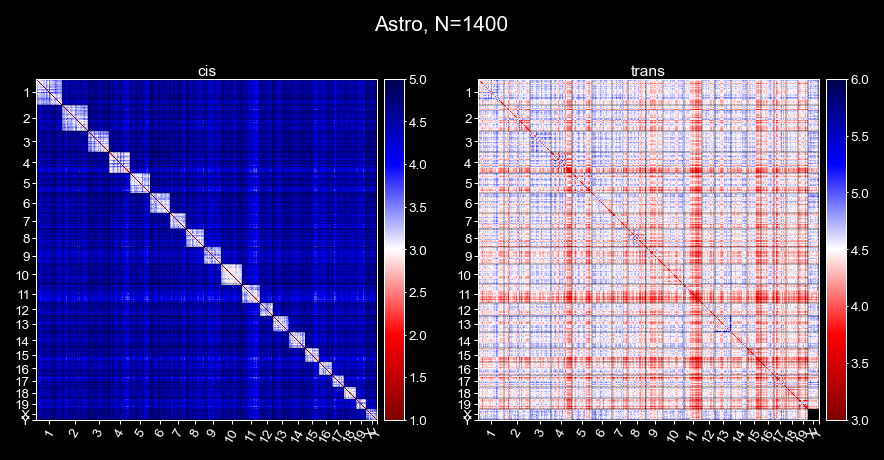

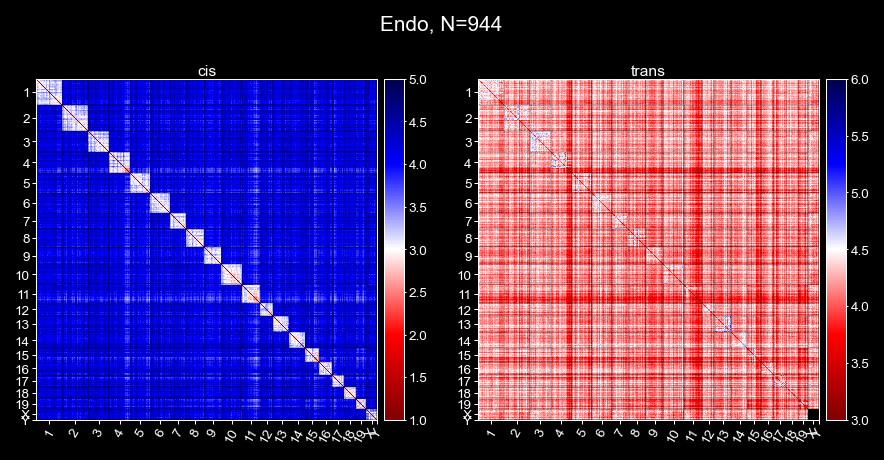

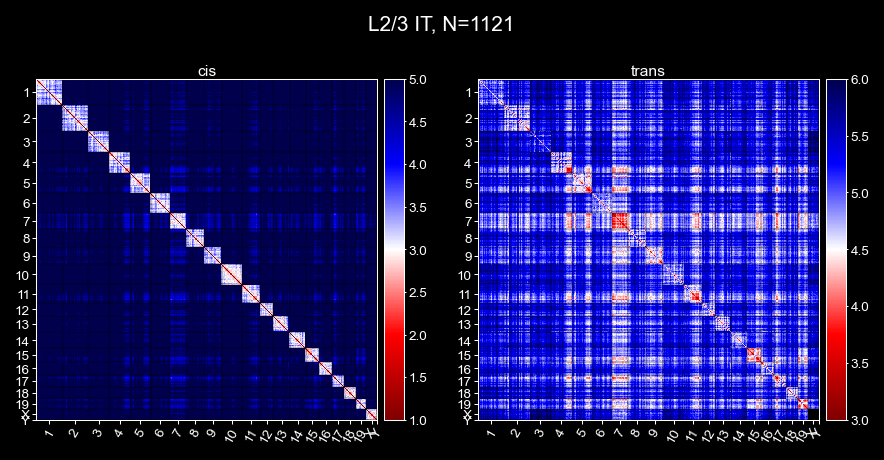

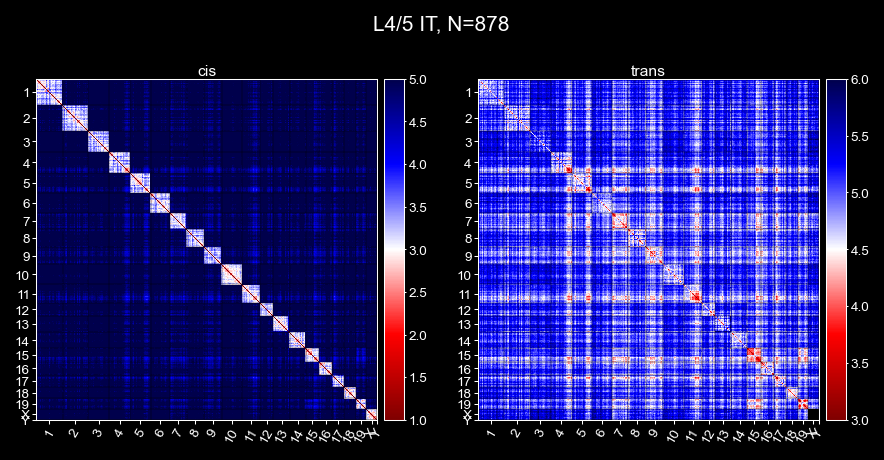

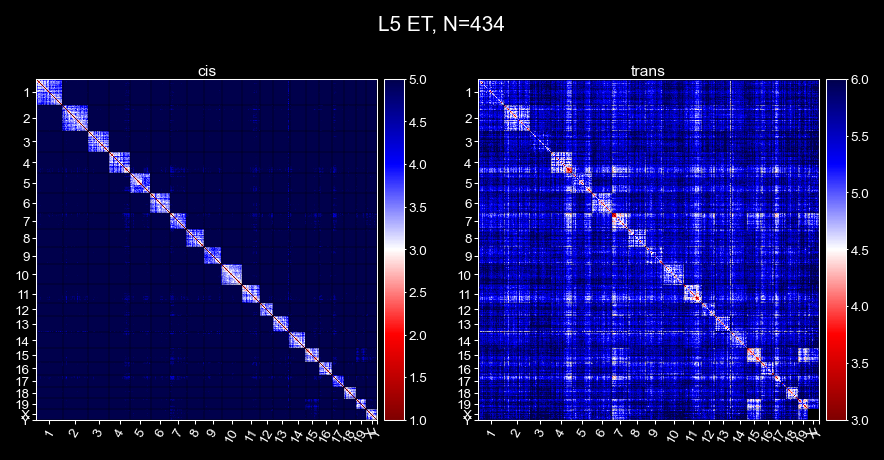

...

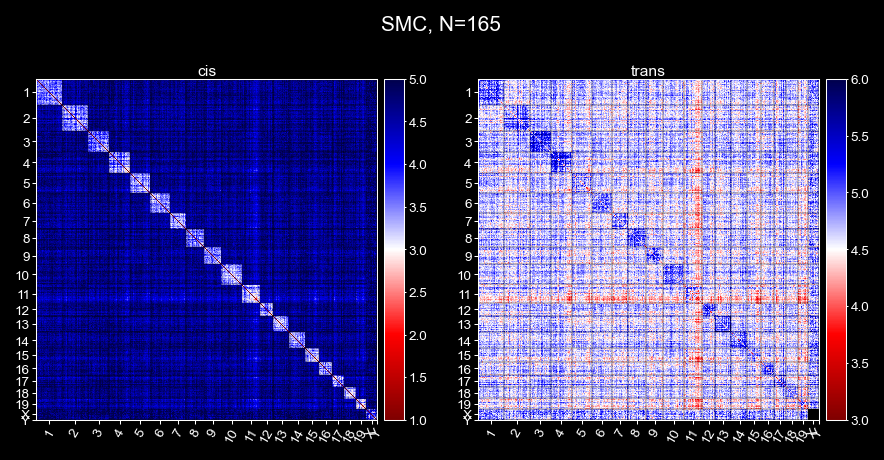

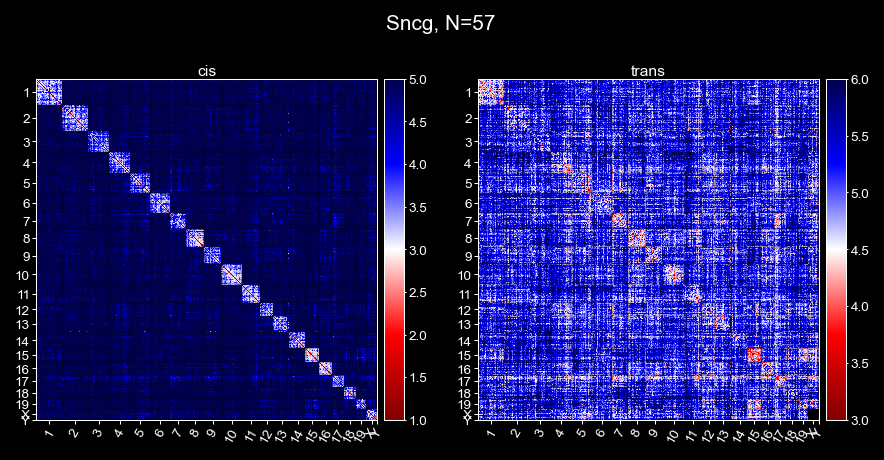

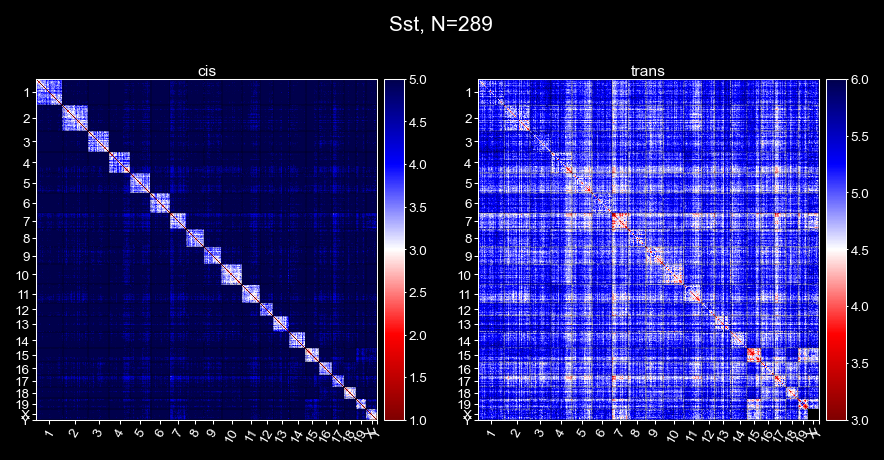

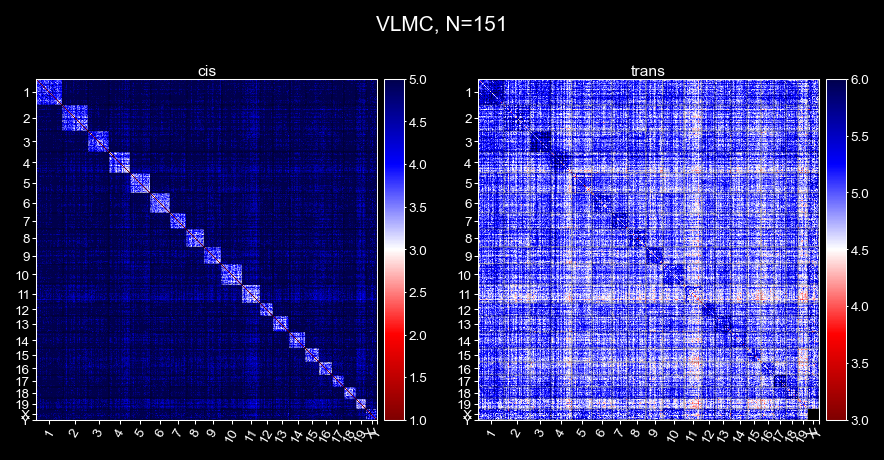

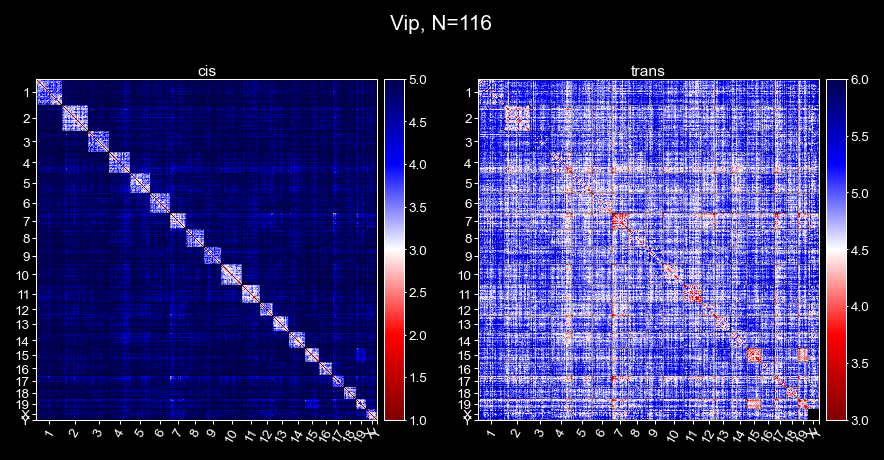

In [27]:
%matplotlib inline

plt.style.use('dark_background')
_single_im_size=3
sel_codebook = merged_codebook
sort_by_region = False

for _class, summary_dict in sorted(class_2_median_dict.items() ):
    
    _cis_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
        summary_dict, merged_codebook, 
        sel_codebook=sel_codebook, 
        use_cis=True, sort_by_region=sort_by_region,
    )
    _trans_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
        summary_dict, merged_codebook, 
        sel_codebook=sel_codebook, 
        use_cis=False, use_trans=True, sort_by_region=sort_by_region,
    )

    fig, axes = plt.subplots(1, 2, figsize=(_single_im_size*2, _single_im_size*1.1), dpi=150, sharex=True, sharey=True)

    ia.figure_tools.distmap.plot_distance_map(_cis_mat/1000, color_limits=[1,5],
                                              ax=axes[0], 
                                                ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                              tick_labels=chr_names,
                                              font_size=6.5)
    ia.figure_tools.distmap.plot_distance_map(_trans_mat/1000, color_limits=[3,6],
                                              ax=axes[1], 
                                              ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                              tick_labels=chr_names, 
                                              font_size=6.5)

    axes[0].set_title(f'cis', fontsize=7.5, pad=2)
    axes[1].set_title(f'trans', fontsize=7.5, pad=2)
    for _ax in axes:
        _ax.hlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
        _ax.vlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
        _ax.xaxis.set_tick_params(which='both', labelbottom=True)
        _ax.yaxis.set_tick_params(which='both', labelleft=True)
    
    fig.subplots_adjust(wspace=0.2, hspace=0.2, left=0.05, right=0.95, top=0.97, bottom=0.02)
    fig.suptitle(f"{_class}, N={len(class_2_chr_zxys[_class])}", fontsize=10, y=0.97)
    fig.savefig(os.path.join(figure_folder, f"cis-trans-median_distmap_byreg_{_class.replace('/','_')}.png"))
    #fig.show()

## 3.2 plot cis for all types

In [28]:
visualize_chr = True

sort_by_region = False

chr_2_indices, chr_2_orders = distance.Generate_PlotOrder(merged_codebook, merged_codebook, sort_by_region=sort_by_region)


C:\Users\puzheng\AppData\Local\Temp/ipykernel_38260/1940974773.py:41: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "tranparent" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(os.path.join(figure_folder, f"all_type_cis_median_distmap_chr-{sel_chr}.png"),
C:\Users\puzheng\AppData\Local\Temp/ipykernel_38260/1940974773.py:47: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


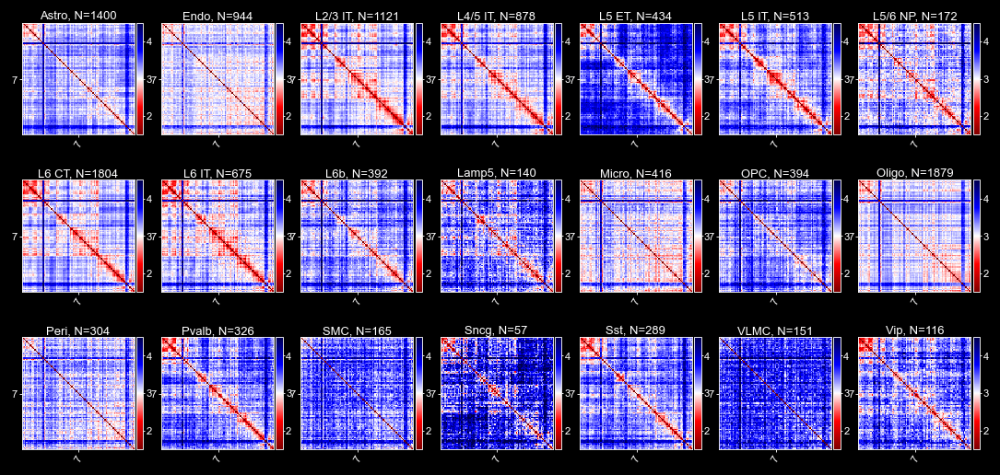

In [29]:
#%matplotlib inline
_single_im_size=1.25
_num_cols = 7
_num_rows =  int(np.ceil(len(class_2_median_dict)/_num_cols))
fig, axes_list = plt.subplots(_num_rows, _num_cols, 
                              figsize=(_single_im_size*_num_cols, _single_im_size*_num_rows*1.1), 
                              dpi=125,
                              sharex=True, sharey=True)
class_names = sorted(list(class_2_median_dict.keys()))
_plot_id = 0
for _row_axes in axes_list:
    for _ax in _row_axes:
        if _plot_id >= len(class_names):
            continue
        _cis_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(class_2_median_dict[class_names[_plot_id]], 
                                                          merged_codebook, use_cis=True, sort_by_region=sort_by_region)
        _ax = ia.figure_tools.distmap.plot_distance_map(
            _cis_mat/1000, color_limits=[1.5, 4.5],
            ticks=(chr_edges[1:] + chr_edges[:-1])/2,
            tick_labels=chr_names,
            font_size=6.5,
            ax=_ax,)
        _ax.set_title(f"{class_names[_plot_id]}, N={len(class_2_chr_zxys[class_names[_plot_id]])}", 
                      fontsize=7.5, pad=2)
        _ax.hlines(chr_edges, 0, len(_cis_mat), color='black', linewidth=0.25)
        _ax.vlines(chr_edges, 0, len(_cis_mat), color='black', linewidth=0.25)
        _ax.xaxis.set_tick_params(which='both', labelbottom=True)
        _ax.yaxis.set_tick_params(which='both', labelleft=True)
        # next plot
        _plot_id += 1
        
fig.subplots_adjust(wspace=0.15, hspace=0.15, left=0.02, right=0.97, top=0.97, bottom=0.02)


if visualize_chr:
    sel_chr = '7'
    #for sel_chr in chr_2_indices:
    sel_chr_inds = chr_2_indices[sel_chr]
    _ax.set_xlim([min(sel_chr_inds), max(sel_chr_inds)])
    _ax.set_ylim([ max(sel_chr_inds), min(sel_chr_inds)])
    fig.savefig(os.path.join(figure_folder, f"all_type_cis_median_distmap_chr-{sel_chr}.png"),
                tranparent=True)
    
else:
    fig.savefig(os.path.join(figure_folder, f"all_type_cis_median_distmap.png"),
                tranparent=True)
fig.show()

## 3.3 Loss-rates

In [30]:
from ImageAnalysis3.structure_tools import distance
sel_codebook = merged_codebook
sort_by_region = True

chr_2_indices, chr_2_orders = distance.Generate_PlotOrder(merged_codebook, sel_codebook, sort_by_region=sort_by_region)
chr_edges, chr_names = distance.generate_plot_chr_edges(sel_codebook, chr_2_indices, sort_by_region=sort_by_region)

In [31]:
chr_2_loss_rates = {}
for _chr in np.unique(sel_codebook['chr']):
    print(_chr)
    _chr_zxys = [_d.get(_chr) for _d in all_chr_2_zxys_list if _chr in _d and len(_d.get(_chr)) > 0]
    if len(_chr_zxys) > 0:
        _chr_zxys = np.concatenate(_chr_zxys)
        chr_2_loss_rates[_chr] = np.isnan(_chr_zxys).any(2).mean(axis=0)

1
10
11
12
13
14
15
16
17
18
19
2
3
4
5
6
7
8
9
X
Y


In [33]:
# get losss-rate vector
loss_rates = np.ones(len(sel_codebook)) * np.nan
for _chr, _rates in chr_2_loss_rates.items():
    loss_rates[chr_2_indices[_chr]] = _rates[chr_2_orders[_chr].astype(np.int32)]

C:\Users\puzheng\AppData\Local\Temp/ipykernel_38260/665003422.py:15: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "tranparent" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.savefig(os.path.join(figure_folder, f"loss_rates_by_region.png"),
C:\Users\puzheng\AppData\Local\Temp/ipykernel_38260/665003422.py:17: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


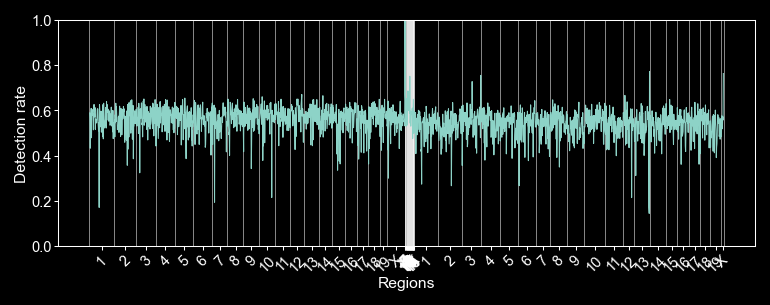

In [34]:
fig, ax = plt.subplots(figsize=(6,2),dpi=150)
_l = ax.plot(1-loss_rates, linewidth=0.5)
ax.set_ylim([0,1])
ax.set_xlabel('Regions', labelpad=1, fontsize=7.5)
ax.set_ylabel('Detection rate', labelpad=1, fontsize=7.5)
# border
[i[1].set_linewidth(0.5) for i in ax.spines.items()]
# ticks
ax.tick_params('both', labelsize=7, 
               width=0.5, length=2,
               pad=1)
ax.vlines(chr_edges-0.5, 0, 1, linewidth=0.25)
ax.set_xticks((chr_edges[1:] + chr_edges[:-1])/2)
ax.set_xticklabels(chr_names, rotation=45)
fig.savefig(os.path.join(figure_folder, f"loss_rates_by_region.png"),
            tranparent=True)
fig.show()

## 3.4 Total median distmap

In [20]:
from ImageAnalysis3.structure_tools import distance

total_median_dict = distance.Chr2ZxysList_2_summaryDict(all_chr_2_zxys_list, merged_codebook, function='nanmedian',
                                                        num_threads=12, verbose=True) 

-- preparing chr_2_zxys from 950 cells in 0.077s.
-- summarize 231 inter-chr distances with 12 threads in 55.012s.


<IPython.core.display.Javascript object>


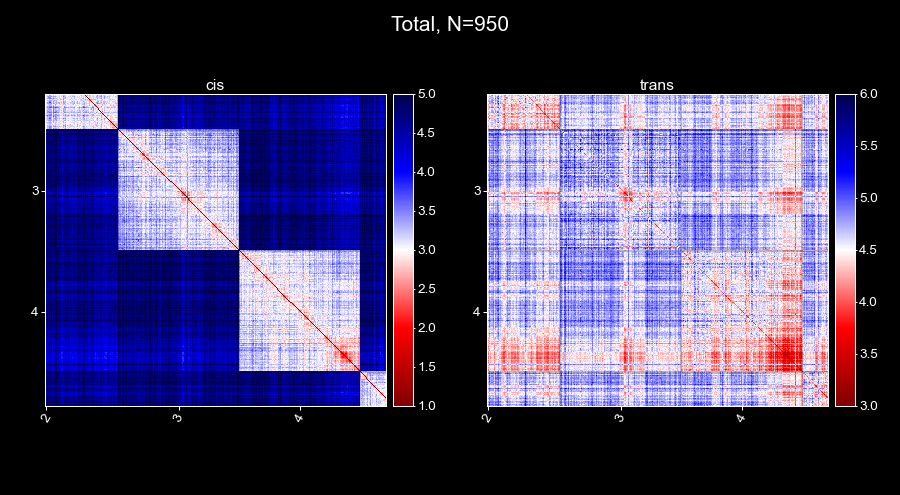

In [22]:
%matplotlib notebook
plt.style.use('dark_background')
_single_im_size=3
sel_codebook = merged_codebook
sort_by_region = False

_cis_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
    total_median_dict, merged_codebook, 
    sel_codebook=sel_codebook, 
    use_cis=True, sort_by_region=sort_by_region,
)
_trans_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
    total_median_dict, merged_codebook, 
    sel_codebook=sel_codebook, 
    use_cis=False, use_trans=True, sort_by_region=sort_by_region,
)

fig, axes = plt.subplots(1, 2, figsize=(_single_im_size*2, _single_im_size*1.1), dpi=150, sharex=True, sharey=True)

ia.figure_tools.distmap.plot_distance_map(_cis_mat/1000, color_limits=[1,5],
                                          ax=axes[0], 
                                            ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names,
                                          font_size=6.5)
ia.figure_tools.distmap.plot_distance_map(_trans_mat/1000, color_limits=[3,6],
                                          ax=axes[1], 
                                          ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names, 
                                          font_size=6.5)

axes[0].set_title(f'cis', fontsize=7.5, pad=2)
axes[1].set_title(f'trans', fontsize=7.5, pad=2)
for _ax in axes:
    _ax.hlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.vlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.xaxis.set_tick_params(which='both', labelbottom=True)
    _ax.yaxis.set_tick_params(which='both', labelleft=True)

fig.subplots_adjust(wspace=0.2, hspace=0.2, left=0.05, right=0.95, top=0.97, bottom=0.02)
fig.suptitle(f"Total, N={len(all_chr_2_zxys_list)}", fontsize=10, y=0.97)
fig.savefig(os.path.join(figure_folder, f"all_cis-trans-median_distmap_byreg.png"))
#fig.show()